# A Fuzzy Set Extension of Schelling's Spatial Segregation Model
# (Ishida, 2023, Journal of Computational Social Science, https://doi.org/10.1007/s42001-023-00234-7)
## A uniform distribution result
### Atsushi Ishida (aishida@kwansei.ac.jp)

# Methods

## Model design

- A fuzzy set version of Schelling's segregation model
- Two groups, A, B with which each agent to be identified
- A membership function $\mu_A(x) \in [0,1]$ indicates an agent $x$'s degree of identification in terms of $A$.
- As the simplest case, we assume $\mu_B(x)=1-\mu_A(x)$.
- Fuzziness of the identity is measured by the binary entropy function
$$H(p)=-p\log_2(p)-(1-p)\log_2(1-p)$$
- $N(x)$: set of neighborhoods of $x$. Base definition of neighbors is the Moore neighbors.
- $p$: percent similar wanted

[Moving decision]
- for $x$ such that $\mu_A(x)>0.5$

if $\displaystyle{\frac{\#\{y \in N(x) | \mu_A(y)\geq \mu_A(x)\}}{\#N(x)} \geq p}$, then stay, else move

- for $x$ such that $\mu_A(x)<0.5$

if $\displaystyle{\frac{\#\{y \in N(x) | \mu_A(y)\leq \mu_A(x)\}}{\#N(x)} \geq p}$, then stay, else move

- for $x$ such that $\mu_A(x)=0.5$

if $\displaystyle{\#N(x) \geq 0}$, then stay, else move


## Measurements

- average neighbors similarity $s(x)\in [0,1]$:
$$\displaystyle{s(x)=1- \frac{1}{\#N(x)}\sum_{y\in N(x)}(\mu_A(y)-\mu_A(x))^2}$$
- binary entropy
$$h(p)=-p\log_2 p -(1-p)\log_2 (1-p)$$
- fuzziness of $A$ in neighbors
$$\phi_A(x)=\frac{1}{\#N(x)+1}\sum_{z\in N(x)\cup \{x\}} h(\mu_A(z))$$

## mu distribution

betabinomial distribution:
- uniform: $\alpha=1, \beta=1$,
- bimodal: $\alpha=0.5, \beta=0.5$,
- unimodal: $\alpha=2, \beta=2$,

# Simulation

## Single run

In [1]:
import fuzzy_Schelling_utils as fs
import numpy as np
import matplotlib.pyplot as plt
plt.style.use(['default'])
import random
import matplotlib.animation as animation
from IPython.display import HTML
# random seed
random.seed(8931)
np.random.seed(8931)

In [2]:
# Global parameters
NUM_ROW = 50
NUM_COL = 50
DENSITY = 0.7
NUM_AGENTS = int((NUM_ROW * NUM_COL) * DENSITY // 1)
PERCENT_SIMILAR_WANTED = 0.3
NUM_TRIALS = 200
# parameters for uniform betabinomial distribution
ALPHA = 1
BETA = 1

In [3]:
# random agents' mu list from random betabinomial distribution
agent_mus = fs.betabinom_mus(ALPHA, BETA, NUM_AGENTS)

# initial field address
occupied_address, non_occupied_address = fs.initial_field_address(NUM_ROW, NUM_COL, NUM_AGENTS)

# assigning agent instances to field
agents_field = fs.initializing_field(NUM_ROW, NUM_COL)
next_move_address = []
mu_list = []
sim_list = []
fuzzy_list = []
unhappy_mu_list = []
happy_mu_list = []
for i, address in enumerate(occupied_address):
    agents_field[address] = fs.Agent(address[0], address[1], agent_mus[i], PERCENT_SIMILAR_WANTED)
    # moving decision for each agent
    agents_field[address].search_neighbors(agents_field)
    agents_field[address].moving_decision()
    mu_list.append(agents_field[address].mu)
    sim_list.append(agents_field[address].s_sq)
    fuzzy_list.append(agents_field[address].fuzzy)
    if agents_field[address].next_move:
        next_move_address.append(address)
        unhappy_mu_list.append(agents_field[address].mu)
    else:
        happy_mu_list.append(agents_field[address].mu)

# image plot of mu, similarity and fuzziness, and number of unhappy agents
plotting_field = fs.initializing_field(NUM_ROW, NUM_COL, dtype=float)
sim_plotting_field = fs.initializing_field(NUM_ROW, NUM_COL, dtype=float)
fuzzy_plotting_field = fs.initializing_field(NUM_ROW, NUM_COL, dtype=float)

for address in occupied_address:
    plotting_field[address] = agents_field[address].mu
    sim_plotting_field[address] = agents_field[address].s_sq
    fuzzy_plotting_field[address] = agents_field[address].fuzzy

unhappy_percent_trend = []
average_similarity_trend = []
average_fuzzy_trend = []

mus = np.arange(0, 0.6, 0.1)# 0.0 & 1.0, 0.1 & 0.9, 0.2 & 0.8, 0.3 & 0.7, 0.4 & 0.6, 0.5

unhappy_percent = []
average_similarity = []
average_fuzzy = []
for mu in mus:
    mu_size = sum(np.isclose(mu_list, mu) | np.isclose(mu_list, 1 - mu))
    unhappy_mu_size = sum(np.isclose(unhappy_mu_list, mu) | np.isclose(unhappy_mu_list, 1 - mu))
    unhappy_percent.append(unhappy_mu_size / mu_size)
    similarity = np.array(sim_list, dtype=float)[np.where(np.isclose(mu_list, mu) | np.isclose(mu_list, 1 - mu))]
    average_similarity.append(np.nanmean(similarity))
    fuzziness = np.array(fuzzy_list, dtype=float)[np.where(np.isclose(mu_list, mu) | np.isclose(mu_list, 1 - mu))]
    average_fuzzy.append(np.mean(fuzziness))

unhappy_percent_trend.append(unhappy_percent)
average_similarity_trend.append(average_similarity)
average_fuzzy_trend.append(average_fuzzy)

# for initial plotting
initial_plotting_field = plotting_field.copy()
initial_sim_plotting_field = sim_plotting_field.copy()
initial_fuzzy_plotting_field = fuzzy_plotting_field.copy()

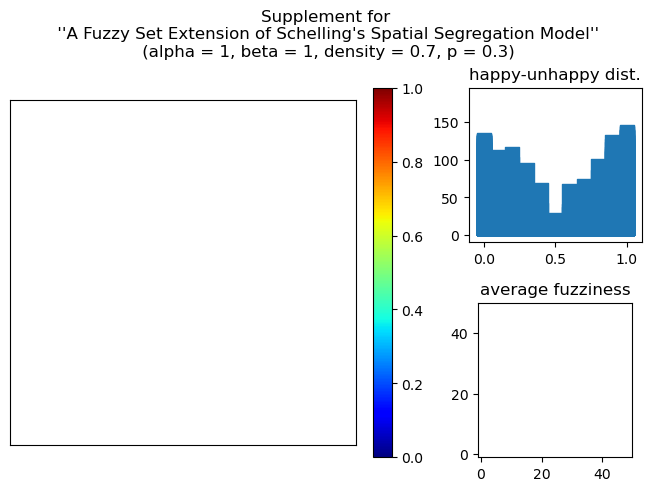

In [4]:
# animation
fig = plt.figure(constrained_layout=True)
ax_dict = fig.subplot_mosaic(
    """
    AAB
    AAC
    """
    )
ims = []

# initial plot
im1 = ax_dict["A"].imshow(plotting_field, vmin=0, vmax=1, cmap="jet")#RdBu
time = ax_dict["A"].text(0, NUM_ROW + 1, "t = 0")
ax_dict["A"].set_ylim([-1,NUM_COL])
ax_dict["A"].set_xlim([-1,NUM_ROW])
x = np.arange(-0.05, 1.15, 0.1)
bar1 = np.histogram(unhappy_mu_list, bins = x)[0]
bar2 = bar1 + np.histogram(happy_mu_list, bins = x)[0]
im2 = ax_dict["B"].fill_between(x, np.append(bar2, bar2[-1]), step="post", color = "tab:orange")
ax_dict["B"].fill_between(x, np.append(bar1, bar1[-1]), step="post", color = "tab:blue")
im3 = ax_dict["C"].imshow(fuzzy_plotting_field, vmin=0, vmax=1, cmap="jet")#RdBu
ax_dict["C"].set_ylim([-1,NUM_COL])
ax_dict["C"].set_xlim([-1,NUM_ROW])
ims.append([im1, time, im2, im3])

for t in range(1, NUM_TRIALS + 1):
    # moving process
    random.shuffle(next_move_address)
    random.shuffle(non_occupied_address)
    for address in next_move_address:
        occupied_address.remove(address)
        next_address = non_occupied_address.pop(0)
        # cross assigning agent instances
        agents_field[next_address], agents_field[address] = agents_field[address], agents_field[next_address]
        agents_field[next_address].row = next_address[0]
        agents_field[next_address].col = next_address[1]
        occupied_address.append(next_address)
        non_occupied_address.append(address)

    # moving decision for each agent
    next_move_address = []
    mu_list = []
    sim_list = []
    fuzzy_list = []
    unhappy_mu_list = []
    for address in occupied_address:
        agents_field[address].search_neighbors(agents_field)
        agents_field[address].moving_decision()
        mu_list.append(agents_field[address].mu)
        sim_list.append(agents_field[address].s_sq)
        fuzzy_list.append(agents_field[address].fuzzy)
        if agents_field[address].next_move:
            next_move_address.append(address)
            unhappy_mu_list.append(agents_field[address].mu)

    # image plot of mu, similarity and fuzziness, and number of unhappy agents
    plotting_field = fs.initializing_field(NUM_ROW, NUM_COL, dtype=float)
    sim_plotting_field = fs.initializing_field(NUM_ROW, NUM_COL, dtype=float)
    fuzzy_plotting_field = fs.initializing_field(NUM_ROW, NUM_COL, dtype=float)

    for address in occupied_address:
        plotting_field[address] = agents_field[address].mu
        sim_plotting_field[address] = agents_field[address].s_sq
        fuzzy_plotting_field[address] = agents_field[address].fuzzy

    mus = np.arange(0, 0.6, 0.1)

    unhappy_percent = []
    average_similarity = []
    average_fuzzy = []
    for mu in mus:
        mu_size = sum(np.isclose(mu_list, mu) | np.isclose(mu_list, 1 - mu))
        unhappy_mu_size = sum(np.isclose(unhappy_mu_list, mu) | np.isclose(unhappy_mu_list, 1 - mu))
        unhappy_percent.append(unhappy_mu_size / mu_size)
        similarity = np.array(sim_list, dtype=float)[np.where(np.isclose(mu_list, mu) | np.isclose(mu_list, 1 - mu))]
        average_similarity.append(np.nanmean(similarity))
        fuzziness = np.array(fuzzy_list, dtype=float)[np.where(np.isclose(mu_list, mu) | np.isclose(mu_list, 1 - mu))]
        average_fuzzy.append(np.mean(fuzziness))

    unhappy_percent_trend.append(unhappy_percent)
    average_similarity_trend.append(average_similarity)
    average_fuzzy_trend.append(average_fuzzy)

    # plotting process
    im1 = ax_dict["A"].imshow(plotting_field, vmin=0, vmax=1, cmap="jet")#RdBu
    time = ax_dict["A"].text(0, NUM_ROW + 1, f't = {t}')
    ax_dict["A"].set_ylim([-1,NUM_COL])
    ax_dict["A"].set_xlim([-1,NUM_ROW])
    bar1 = np.histogram(unhappy_mu_list, bins = x)[0]
    im2 = ax_dict["B"].fill_between(x, np.append(bar2, bar2[-1]), step="post", color = "tab:orange")
    ax_dict["B"].fill_between(x, np.append(bar1, bar1[-1]), step="post", color = "tab:blue")
    im3 = ax_dict["C"].imshow(fuzzy_plotting_field, vmin=0, vmax=1, cmap="jet")#RdBu
    ax_dict["C"].set_ylim([-1,NUM_COL])
    ax_dict["C"].set_xlim([-1,NUM_ROW])
    ims.append([im1, time, im2, im3])

    # if everyone happy, then break
    if not next_move_address:
        break

fig.suptitle("Supplement for\n ''A Fuzzy Set Extension of Schelling's Spatial Segregation Model''\n (alpha = " +  str(ALPHA) + ", beta = " +  str(BETA) + ", density = " + str(DENSITY) + ", p = " + str(PERCENT_SIMILAR_WANTED) + ")")
ax_dict["A"].axes.get_xaxis().set_visible(False)
ax_dict["A"].axes.get_yaxis().set_visible(False)
ax_dict["B"].set_title("happy-unhappy dist.", loc="center")
ax_dict["C"].set_title("average fuzziness", loc="center")
fig.colorbar(im1, ax=ax_dict["A"])

ani = animation.ArtistAnimation(fig, ims)
# ani.save("Fuzzy_Schelling_model_beta_uniform_example.mp4", writer="ffmpeg")
## You might need: brew install ffmpeg
HTML(ani.to_jshtml())

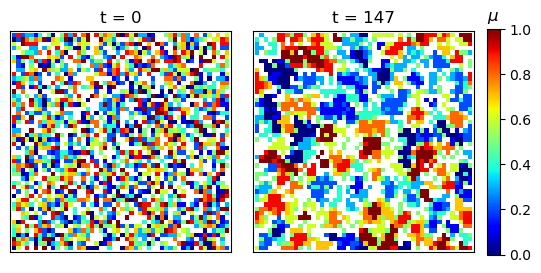

In [5]:
# Change of mu distribution
fig, ax = plt.subplots(ncols=2)

left = ax[0].imshow(initial_plotting_field, vmin=0, vmax=1, cmap="jet")
ax[0].set_title("t = 0")
ax[0].set_ylim([-1,NUM_COL])
ax[0].set_xlim([-1,NUM_ROW])
ax[0].axes.get_xaxis().set_visible(False)
ax[0].axes.get_yaxis().set_visible(False)

right = ax[1].imshow(plotting_field, vmin=0, vmax=1, cmap="jet")
ax[1].set_title(f't = {t}')
ax[1].set_ylim([-1,NUM_COL])
ax[1].set_xlim([-1,NUM_ROW])
ax[1].axes.get_xaxis().set_visible(False)
ax[1].axes.get_yaxis().set_visible(False)

axpos = ax[1].get_position()
cbar_ax = fig.add_axes([0.87, axpos.y0, 0.02, axpos.height])

cbar = fig.colorbar(right, cax=cbar_ax)
cbar.ax.set_title(r'$ \mu $')
plt.subplots_adjust(right=0.85)
plt.subplots_adjust(wspace=0.1)
# plt.savefig('TeX/result_uniform_mu_dist.pdf',bbox_inches='tight')
plt.show();

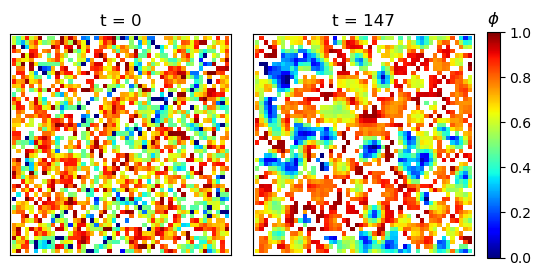

In [6]:
# Change of fuzziness distribution
fig, ax = plt.subplots(ncols=2)

left = ax[0].imshow(initial_fuzzy_plotting_field, vmin=0, vmax=1, cmap="jet")
ax[0].set_title("t = 0")
ax[0].set_ylim([-1,NUM_COL])
ax[0].set_xlim([-1,NUM_ROW])
ax[0].axes.get_xaxis().set_visible(False)
ax[0].axes.get_yaxis().set_visible(False)

right = ax[1].imshow(fuzzy_plotting_field, vmin=0, vmax=1, cmap="jet")
ax[1].set_title(f't = {t}')
ax[1].set_ylim([-1,NUM_COL])
ax[1].set_xlim([-1,NUM_ROW])
ax[1].axes.get_xaxis().set_visible(False)
ax[1].axes.get_yaxis().set_visible(False)

axpos = ax[1].get_position()
cbar_ax = fig.add_axes([0.87, axpos.y0, 0.02, axpos.height])

cbar = fig.colorbar(right, cax=cbar_ax)
cbar.ax.set_title(r'$ \phi $')
plt.subplots_adjust(right=0.85)
plt.subplots_adjust(wspace=0.1)
# plt.savefig('TeX/result_uniform_fuzziness_dist.pdf',bbox_inches='tight')
plt.show();

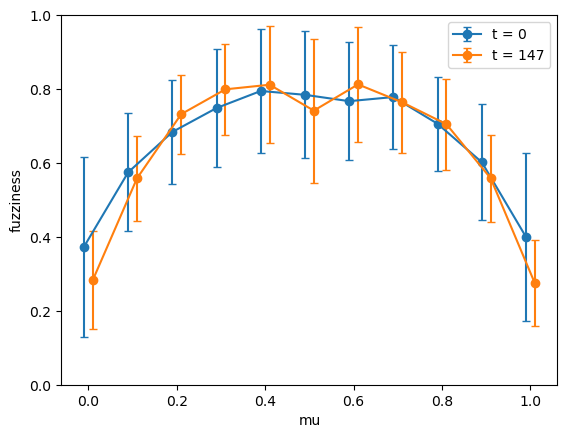

In [7]:
initial_mu = initial_plotting_field.flatten()
initial_fuzzy = initial_fuzzy_plotting_field.flatten()
last_mu = plotting_field.flatten()
last_fuzzy = fuzzy_plotting_field.flatten()
mus = np.arange(0, 1.1, 0.1)

initial_fuzzy_mean = []
initial_fuzzy_std = []
for mu in mus:
    fuzziness = initial_fuzzy[np.where(np.isclose(initial_mu, mu))]
    initial_fuzzy_mean = np.append(initial_fuzzy_mean, np.mean(fuzziness))
    initial_fuzzy_std = np.append(initial_fuzzy_std, np.std(fuzziness))

last_fuzzy_mean = []
last_fuzzy_std = []
for mu in mus:
    fuzziness = last_fuzzy[np.where(np.isclose(last_mu, mu))]
    last_fuzzy_mean = np.append(last_fuzzy_mean, np.mean(fuzziness))
    last_fuzzy_std = np.append(last_fuzzy_std, np.std(fuzziness))

plt.errorbar(mus - 0.01, initial_fuzzy_mean, yerr=initial_fuzzy_std,  marker="o",  capsize=3, label="t = 0")
plt.errorbar(mus + 0.01, last_fuzzy_mean, yerr=last_fuzzy_std,  marker="o",  capsize=3, label=f't = {t}')
# plt.title("Mean of fuzziness (with std bar) according to mu")
plt.ylim(0,1)
plt.xlabel("mu")
plt.ylabel("fuzziness")
plt.legend(loc=1)
# plt.savefig('TeX/result_uniform_mean_fuzziness.pdf',bbox_inches='tight')
plt.show();

In [8]:
labels = ["h = 0.000", "h = 0.469", "h = 0.722", "h = 0.881", "h = 0.971", "h = 1.000"]
# ["mu = 0.0 & 1.0", "mu = 0.1 & 0.9", "mu = 0.2 & 0.8", "mu = 0.3 & 0.7", "mu = 0.4 & 0.6", "mu = 0.5"]

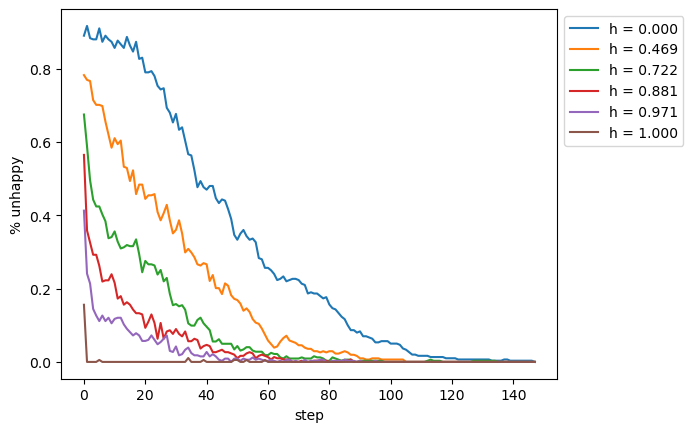

In [9]:
plt.plot(np.arange(t + 1), unhappy_percent_trend, label=labels)
plt.ylabel("% unhappy")
plt.xlabel("step")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)
# plt.savefig('TeX/result_uniform_unhappy_percent_for_h.pdf',bbox_inches='tight')
plt.show();

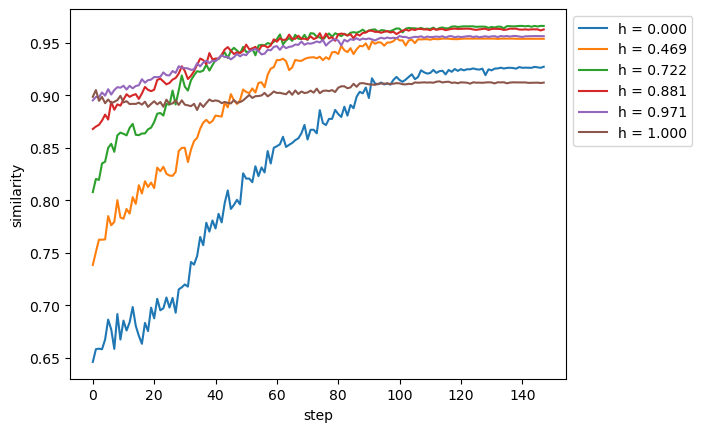

In [10]:
plt.plot(np.arange(t + 1), average_similarity_trend, label=labels)
plt.ylabel("similarity")
plt.xlabel("step")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)
# plt.savefig('TeX/result_uniform_similarity_for_h.pdf',bbox_inches='tight')
plt.show();

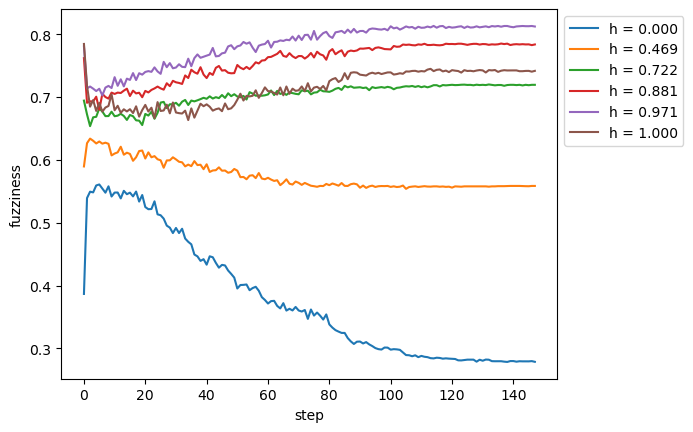

In [11]:
plt.plot(np.arange(t + 1), average_fuzzy_trend, label=labels)
plt.ylabel("fuzziness")
plt.xlabel("step")
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)
# plt.savefig('TeX/result_uniform_fuzziness_for_h.pdf',bbox_inches='tight')
plt.show();

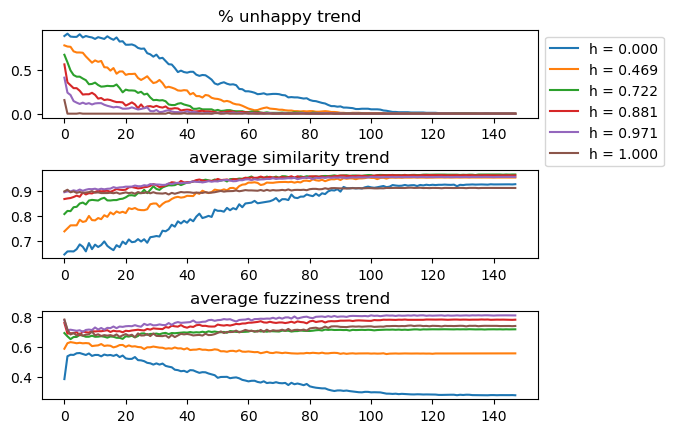

In [12]:
fig, ax = plt.subplots(nrows=3)
ax[0].plot(np.arange(t + 1), unhappy_percent_trend, label=labels)
ax[0].set_title("% unhappy trend")
ax[0].legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)

ax[1].plot(np.arange(t + 1), average_similarity_trend, label=labels)
ax[1].set_title("average similarity trend")

ax[2].plot(np.arange(t + 1), average_fuzzy_trend, label=labels)
ax[2].set_title("average fuzziness trend")

plt.subplots_adjust(hspace=0.6) # wspace=0.4
# plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.3), ncol=2)
# plt.savefig('TeX/result_uniform_trends_for_h.pdf',bbox_inches='tight')
plt.show();

## Multiple runs

In [13]:
# number of simulation runs
NUM_RUN = 100

In [14]:
unhappy_percent_trends = []
average_similarity_trends = []
average_fuzzy_trends = []

for run in range(NUM_RUN):

    unhappy_percent_trend, average_similarity_trend, average_fuzzy_trend = fs.trial_for_h(
        NUM_ROW = NUM_ROW,
        NUM_COL = NUM_COL,
        DENSITY = DENSITY,
        PERCENT_SIMILAR_WANTED = PERCENT_SIMILAR_WANTED,
        NUM_TRIALS = NUM_TRIALS,
        ALPHA = ALPHA,
        BETA = BETA
        )

    # If the equilibrium is reached before the 200th time, the last value is filled to the 200th time.
    for index in (unhappy_percent_trend, average_similarity_trend, average_fuzzy_trend):
        for t in range(len(index), NUM_TRIALS + 1):
            index.append(index[-1])

    unhappy_percent_trends.append(unhappy_percent_trend)
    average_similarity_trends.append(average_similarity_trend)
    average_fuzzy_trends.append(average_fuzzy_trend)

unhappy_percent_means = np.array(unhappy_percent_trends)[:,::50,:].mean(axis=0)
unhappy_percent_stds = np.array(unhappy_percent_trends)[:,::50,:].std(axis=0)
average_similarity_means = np.array(average_similarity_trends)[:,::50,:].mean(axis=0)
average_similarity_stds = np.array(average_similarity_trends)[:,::50,:].std(axis=0)
average_fuzzy_means = np.array(average_fuzzy_trends)[:,::50,:].mean(axis=0)
average_fuzzy_stds = np.array(average_fuzzy_trends)[:,::50,:].std(axis=0)

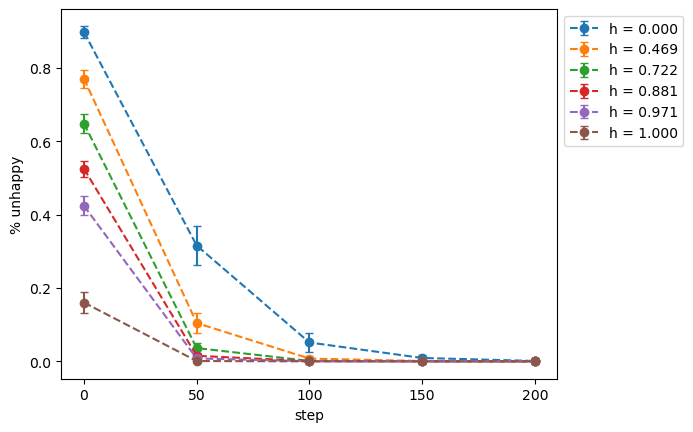

In [18]:
for i in range(6):
    plt.errorbar(np.arange(0, 201,50), unhappy_percent_means[:,i], yerr=unhappy_percent_stds[:,i], capsize=3, linestyle='--', marker='o', label=labels[i])
plt.ylabel("% unhappy")
plt.xlabel("step")
plt.xticks([0,50,100,150,200])
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)
# plt.savefig('TeX/multi_result_uniform_unhappy_percent_for_h.pdf',bbox_inches='tight')
plt.show();

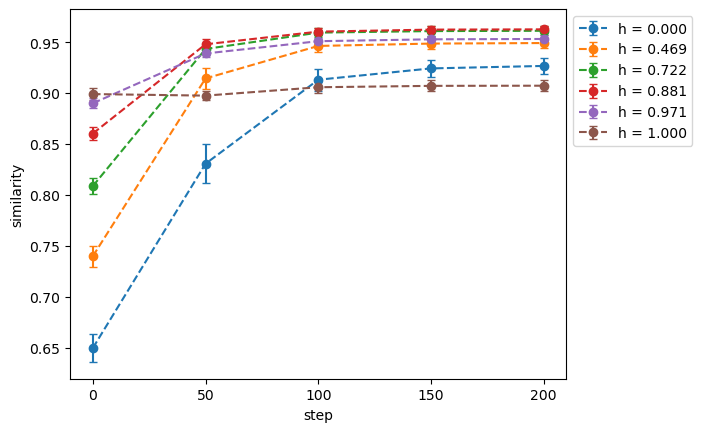

In [19]:
for i in range(6):
    plt.errorbar(np.arange(0, 201,50), average_similarity_means[:,i], yerr=average_similarity_stds[:,i], capsize=3, linestyle='--', marker='o', label=labels[i])
plt.ylabel("similarity")
plt.xlabel("step")
plt.xticks([0,50,100,150,200])
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)
# plt.savefig('TeX/multi_result_uniform_similarity_for_h.pdf',bbox_inches='tight')
plt.show();

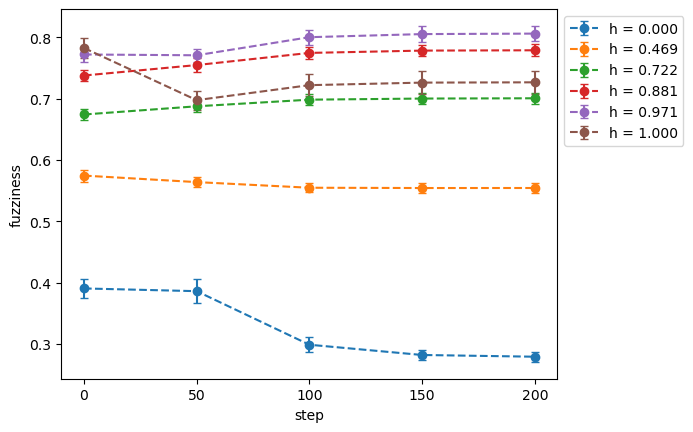

In [22]:
for i in range(6):
    plt.errorbar(np.arange(0, 201,50), average_fuzzy_means[:,i], yerr=average_fuzzy_stds[:,i], capsize=3, linestyle='--', marker='o', label=labels[i])
plt.ylabel("fuzziness")
plt.xlabel("step")
plt.xticks([0,50,100,150,200])
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), ncol=1)
# plt.savefig('TeX/multi_result_uniform_fuzziness_for_h.pdf',bbox_inches='tight')
plt.show();